In [1]:
import pandas as pd
import numpy as np
import statistics as stat
import matplotlib.pyplot as plt

In [2]:
# load prices data to one df
prices = [pd.read_csv("./round-1-island-data-bottle/prices_round_1_day_-2.csv",sep=";"),
          pd.read_csv("./round-1-island-data-bottle/prices_round_1_day_-1.csv",sep=";"),
          pd.read_csv("./round-1-island-data-bottle/prices_round_1_day_0.csv",sep=";")]
prices = pd.concat(prices, axis = 0)
prices['timestamp_new'] = (prices['day'] + 2) * 1000000 + prices['timestamp']

# load trades data to one df
trades1 = pd.read_csv("./round-1-island-data-bottle/trades_round_1_day_-2_nn.csv",sep=";")
trades2 = pd.read_csv("./round-1-island-data-bottle/trades_round_1_day_-1_nn.csv",sep=";")
trades3 = pd.read_csv("./round-1-island-data-bottle/trades_round_1_day_0_nn.csv",sep=";")

trades1['timestamp_new'] = trades1['timestamp']
trades2['timestamp_new'] = trades2['timestamp'] + 1000000
trades3['timestamp_new'] = trades3['timestamp'] + 2000000
trades = pd.concat([trades1, trades2, trades3], axis = 0)


In [3]:
# trade summary, average price and total quantity of each symbol and each timestamp
trades['total'] = trades['price'] * trades['quantity']
trades.rename(columns={'symbol':'product'}, inplace = True)
trade_summary = trades.groupby(['timestamp_new','product']).agg({'price':'mean', 'quantity':'sum', 'total':'sum'})

In [4]:
trade_summary['vwap'] = trade_summary['total']/ trade_summary['quantity']
trade_summary.reset_index(inplace = True)


In [5]:
data = pd.merge(prices, trade_summary, on = ['timestamp_new','product'], how="left")
data[['price','quantity','total','vwap']] = data.groupby('product')[['price','quantity','total','vwap']].fillna(method='ffill')
data[['price','quantity','total','vwap']] = data.groupby('product')[['price','quantity','total','vwap']].shift()
data.set_index('timestamp_new', inplace = True)

In [6]:
data['spread'] = data['ask_price_1'] - data['bid_price_1']

# STARFRUIT

In [62]:
s = data.query("product == 'STARFRUIT'")

<Axes: xlabel='timestamp_new'>

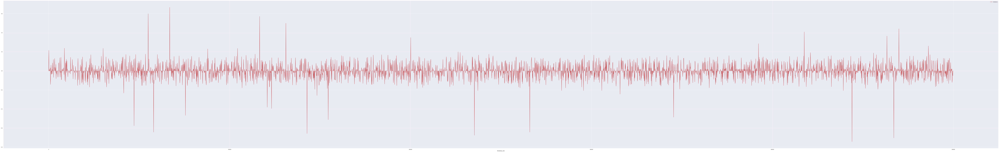

In [106]:
plt.figure(figsize=[200,30])
s['imbalance'][:5000].plot(color='r', lw=2., legend=True)

In [107]:
s[2999]

,day,timestamp,product,bid_price_1,bid_volume_1,bid_price_2,bid_volume_2,bid_price_3,bid_volume_3,ask_price_1,...,mid_price,profit_and_loss,price,quantity,total,vwap,spread,total_bid_volume,total_ask_volume,imbalance
timestamp_new,,,,,,,,,,,,,,,,,,,,,
0,-2,0,STARFRUIT,4997,26,NaN,0.0,NaN,0.0,5003,...,5000.0,0.0,NaN,NaN,NaN,NaN,6,26.0,26.0,0.000000
100,-2,100,STARFRUIT,5000,5,4998.0,6.0,4997.0,20.0,5004,...,5002.0,0.0,5003.0,1.0,5003.0,5003.0,4,31.0,20.0,0.215686
200,-2,200,STARFRUIT,4997,1,4996.0,30.0,NaN,0.0,5003,...,5000.0,0.0,5004.0,6.0,30024.0,5004.0,6,31.0,31.0,0.000000
300,-2,300,STARFRUIT,4996,27,NaN,0.0,NaN,0.0,5003,...,4999.5,0.0,5004.0,6.0,30024.0,5004.0,7,27.0,27.0,0.000000
400,-2,400,STARFRUIT,4995,20,NaN,0.0,NaN,0.0,5002,...,4998.5,0.0,5004.0,6.0,30024.0,5004.0,7,20.0,20.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2999500,0,999500,STARFRUIT,5049,28,NaN,0.0,NaN,0.0,5056,...,5052.5,0.0,5050.0,1.0,5050.0,5050.0,7,28.0,28.0,0.000000
2999600,0,999600,STARFRUIT,5048,9,5047.0,27.0,NaN,0.0,5054,...,5051.0,0.0,5049.0,2.0,10098.0,5049.0,6,36.0,29.0,0.107692
2999700,0,999700,STARFRUIT,5053,1,5048.0,26.0,NaN,0.0,5054,...,5053.5,0.0,5048.0,1.0,5048.0,5048.0,1,27.0,26.0,0.018868


In [136]:
signal = s['imbalance'] > 0.25
neg_signal = s['imbalance'] < -0.25

In [135]:
s['imbalance'].max()

0.7419354838709677

In [143]:
s.spread.mean()

5.3996

In [144]:
product = 'STARFRUIT'
endpoint= 5000
plt.figure(figsize=[200,80])
# data.query(f"product == '{product}'")['mid_price'][:endpoint].plot(color='blue', lw=2., legend=True)
plt.plot(s.query(f"product == '{product}'")['vwap'][:endpoint],color='y', lw=2.)
# s.query(f"product == '{product}'")['bid_price_1'][:endpoint].plot(color='g', lw=2., legend=True)
# data.query(f"product == '{product}'")['ask_price_1'][:endpoint].plot(color='r', lw=2., legend=True)
for i in signal[:endpoint].index:
    if signal[i]:
        plt.axvline(x=i, color='g', linestyle='--', linewidth=2)
    if neg_signal[i]:
        plt.axvline(x=i, color='r', linestyle='--', linewidth=2)
plt.show()

In [202]:
def turtle_trading(financial_data, window_size):
    signals = pd.DataFrame(index=financial_data.index)
    signals['orders'] = 0
    signals['mid_price'] = financial_data['mid_price']
    # window_size-days high
    signals['high'] = financial_data['mid_price'].shift(1).\
    rolling(window=window_size).max()
    # window_size-days low
    signals['low'] = financial_data['mid_price'].shift(1).\
    rolling(window=window_size).min()
    # window_size-days mean
    signals['avg'] = financial_data['mid_price'].shift(1).\
    rolling(window=window_size).mean()

    # rule for the entry signal
    signals['long_entry'] = financial_data['mid_price'] > signals['high']
    signals['short_entry'] = financial_data['mid_price'] < signals['low']

    # rule for the exit signal
    signals['long_exit'] = financial_data['mid_price'] < signals['avg']
    signals['short_exit'] = financial_data['mid_price'] > signals['avg']

    # rules to determine the orders
    init=True
    position=0
    for k in range(len(signals)):
        # long signal and no position at the moment: entry a long position
        if signals['long_entry'][k] and position==0:
            signals.orders.values[k] = 1
            position=1
        # short signal and no position at the moment: entry a short position
        elif signals['short_entry'][k] and position==0:
            signals.orders.values[k] = -1
            position=-1
        # short exit signal and short position at the moment: exit the short position
        elif signals['short_exit'][k] and position < 0:
            signals.orders.values[k] = 1
            position = 0
        # long exit signal and long position at the moment: exit the long position
        elif signals['long_exit'][k] and position > 0:
            signals.orders.values[k] = -1
            position = 0
        else:
            # no signal needed
            signals.orders.values[k] = 0
    return signals


In [213]:
ts=turtle_trading(a[:endpoint].reset_index(drop = True), 20)

In [214]:
fig = plt.figure(figsize=[200,80])
ax1 = fig.add_subplot(111, ylabel='Google price in $')
a[:endpoint].reset_index(drop = True)["mid_price"].plot(ax=ax1, color='b', lw=.5)
#ts["low"].plot(ax=ax1, color='r', lw=2.)
#ts["high"].plot(ax=ax1, color='g', lw=2.)
#ts["avg"].plot(ax=ax1, color='yellow', lw=2.)
ax1.plot(ts.loc[ts.orders== 1.0].index,
a[:endpoint].reset_index(drop = True)["mid_price"][ts.orders == 1],'^', markersize=7, color='k')
ax1.plot(ts.loc[ts.orders== -1.0].index,
a[:endpoint].reset_index(drop = True)["mid_price"][ts.orders == -1],'v', markersize=7, color='k')
plt.legend(["Price","low","high"])
plt.title("Turtle Trading Strategy")
plt.show()

## order pressure based on bid-ask volume
1. calculate the total volume of bid and ask
2. calculate the imblance 
3. long/ short term momentum

In [ ]:
def strategy(tick_data, order_book):
    # Calculate order book imbalance
    total_bid_volume = sum([level.volume for level in order_book.bids[:3]])
    total_ask_volume = sum([level.volume for level in order_book.asks[:3]])
    imbalance = (total_bid_volume - total_ask_volume) / (total_bid_volume + total_ask_volume)
    
    # Calculate price momentum
    short_term_momentum = calculate_momentum(tick_data, window=5)
    long_term_momentum = calculate_momentum(tick_data, window=10)
    
    # Generate signals
    if imbalance > 0.2 and short_term_momentum > long_term_momentum:
        return 'Buy'
    elif imbalance < -0.2 and short_term_momentum < long_term_momentum:
        return 'Sell'
    else:
        return 'Hold'

In [70]:
s.columns

Index(['day', 'timestamp', 'product', 'bid_price_1', 'bid_volume_1',
       'bid_price_2', 'bid_volume_2', 'bid_price_3', 'bid_volume_3',
       'ask_price_1', 'ask_volume_1', 'ask_price_2', 'ask_volume_2',
       'ask_price_3', 'ask_volume_3', 'mid_price', 'profit_and_loss', 'price',
       'quantity', 'total', 'vwap', 'spread'],
      dtype='object')

In [71]:
s[['bid_volume_1','bid_volume_2','bid_volume_3','ask_volume_1','ask_volume_2','ask_volume_3']] = s[['bid_volume_1','bid_volume_2','bid_volume_3','ask_volume_1','ask_volume_2','ask_volume_3']].fillna(0)

/var/folders/cb/3xpyndm50zq34mbkkt98j8l00000gq/T/ipykernel_56321/1538797013.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  s[['bid_volume_1','bid_volume_2','bid_volume_3','ask_volume_1','ask_volume_2','ask_volume_3']] = s[['bid_volume_1','bid_volume_2','bid_volume_3','ask_volume_1','ask_volume_2','ask_volume_3']].fillna(0)


In [75]:
s[['bid_volume_1','bid_volume_2','bid_volume_3']].sum(axis = 1)

timestamp_new
0          26.0
100        31.0
200        31.0
300        27.0
400        20.0
           ... 
2999500    28.0
2999600    36.0
2999700    27.0
2999800    27.0
2999900    23.0
Length: 30000, dtype: float64

In [76]:
s['total_bid_volume'] = s[['bid_volume_1','bid_volume_2','bid_volume_3']].sum(axis = 1)
s['total_ask_volume'] = s[['ask_volume_1','ask_volume_2','ask_volume_3']].sum(axis = 1)

/var/folders/cb/3xpyndm50zq34mbkkt98j8l00000gq/T/ipykernel_56321/3168289848.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  s['total_bid_volume'] = s[['bid_volume_1','bid_volume_2','bid_volume_3']].sum(axis = 1)
/var/folders/cb/3xpyndm50zq34mbkkt98j8l00000gq/T/ipykernel_56321/3168289848.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  s['total_ask_volume'] = s[['ask_volume_1','ask_volume_2','ask_volume_3']].sum(axis = 1)


In [86]:
s['imbalance'] = (s['total_bid_volume'] - s['total_ask_volume']) / (s['total_bid_volume'] + s['total_ask_volume'])

/var/folders/cb/3xpyndm50zq34mbkkt98j8l00000gq/T/ipykernel_56321/3444722020.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  s['imbalance'] = (s['total_bid_volume'] - s['total_ask_volume']) / (s['total_bid_volume'] + s['total_ask_volume'])


In [91]:
import seaborn as sns
sns.set()


In [102]:
s['imbalance'].mean() + s['imbalance'].std()*1.96

0.13018294906822028

<Axes: xlabel='imbalance', ylabel='Density'>

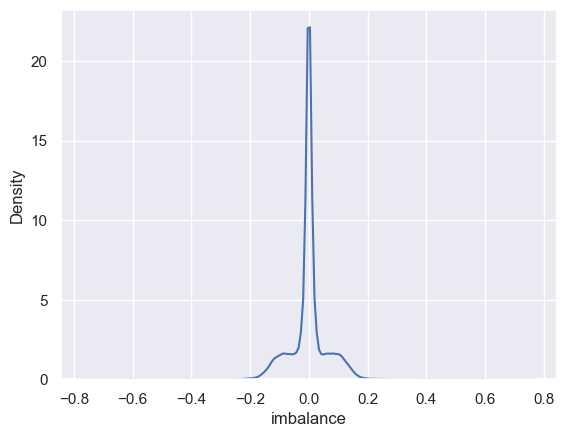

In [97]:
sns.kdeplot(s['imbalance'])

In [90]:
s['imbalance']

-0.7419354838709677

In [81]:
s.bid_price_1.isna().sum()

0

# AMETHYSTS

In [11]:
a = data.query("product == 'AMETHYSTS'")

In [52]:
a.query("ask_price_1 == 9998")

,day,timestamp,product,bid_price_1,bid_volume_1,bid_price_2,bid_volume_2,bid_price_3,bid_volume_3,ask_price_1,...,ask_volume_2,ask_price_3,ask_volume_3,mid_price,profit_and_loss,price,quantity,total,vwap,spread
timestamp_new,,,,,,,,,,,,,,,,,,,,,
400,-2,400,AMETHYSTS,9995,20,NaN,NaN,NaN,NaN,9998,...,9.0,10005.0,20.0,9996.5,0.0,9996.0,2.0,19992.0,9996.0,3
1400,-2,1400,AMETHYSTS,9995,26,NaN,NaN,NaN,NaN,9998,...,26.0,NaN,NaN,9996.5,0.0,9996.0,2.0,19992.0,9996.0,3
2500,-2,2500,AMETHYSTS,9995,21,NaN,NaN,NaN,NaN,9998,...,21.0,NaN,NaN,9996.5,0.0,10004.0,1.0,10004.0,10004.0,3
8500,-2,8500,AMETHYSTS,9996,1,9995.0,23.0,NaN,NaN,9998,...,1.0,10005.0,23.0,9997.0,0.0,10002.0,1.0,10002.0,10002.0,2
12800,-2,12800,AMETHYSTS,9995,20,NaN,NaN,NaN,NaN,9998,...,10.0,10005.0,20.0,9996.5,0.0,10005.0,2.0,20010.0,10005.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2996600,0,996600,AMETHYSTS,9996,2,9995.0,22.0,NaN,NaN,9998,...,8.0,10004.0,2.0,9997.0,0.0,10004.0,3.0,30012.0,10004.0,2
2996900,0,996900,AMETHYSTS,9996,2,9995.0,28.0,NaN,NaN,9998,...,2.0,10005.0,28.0,9997.0,0.0,10005.0,2.0,20010.0,10005.0,2
2997400,0,997400,AMETHYSTS,9996,1,9995.0,22.0,NaN,NaN,9998,...,1.0,10005.0,22.0,9997.0,0.0,9996.0,1.0,9996.0,9996.0,2


# Regression training

In [202]:
import sys
# caution: path[0] is reserved for script path (or '' in REPL)
sys.path.insert(1, '../../prosperity2bt/')
sys.path.insert(1, '../')

import hypertune
import round_1_train as round_1_train
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge
import optuna

In [310]:
from sklearn.metrics import mean_squared_error

In [214]:
from importlib import reload
reload(round_1_train)

<module 'round_1_train' from '/Users/Leo.Leung/code/IMC-trading/analysis/round_1_train.py'>

## prepare data

In [387]:
data_train = s[['bid_price_1', 'bid_volume_1',
       'bid_price_2', 'bid_volume_2', 'bid_price_3', 'bid_volume_3',
       'ask_price_1', 'ask_volume_1', 'ask_price_2', 'ask_volume_2',
       'ask_price_3', 'ask_volume_3','mid_price','quantity', 'total', 'vwap', 'spread', 'total_bid_volume',
       'total_ask_volume', 'imbalance']]

In [389]:
data_train = data_train[['mid_price','imbalance','spread','vwap']]

In [190]:
data_train['mid_price_1'] = data_train['mid_price'].shift(1)
data_train['mid_price_2'] = data_train['mid_price'].shift(2)
data_train['mid_price_3'] = data_train['mid_price'].shift(3)
data_train['imbalance_1'] = data_train['imbalance'].shift(1)
data_train['spread_1'] = data_train['spread'].shift(1)
data_train['vwap_1'] = data_train['vwap'].shift(1)


/var/folders/cb/3xpyndm50zq34mbkkt98j8l00000gq/T/ipykernel_56321/349454972.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_train['mid_price_1'] = data_train['mid_price'].shift(1)
/var/folders/cb/3xpyndm50zq34mbkkt98j8l00000gq/T/ipykernel_56321/349454972.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_train['mid_price_2'] = data_train['mid_price'].shift(2)
/var/folders/cb/3xpyndm50zq34mbkkt98j8l00000gq/T/ipykernel_56321/349454972.py:3: SettingWithCopyWarning: 
A value is trying to be set on

In [ ]:
data_train = data_train[['mid_price_3','mid_price_2','mid_price_1','mid_price','imbalance_1','imbalance','spread_1','spread','vwap_1','vwap']]

In [309]:
data_train = data_train[3:-2]

In [457]:
def objective(trial, X_train, y_train, X_val, y_val) -> float:
    '''
    The oobjective function for the optimisation problem.
    
    Args:
        trial: optuna.trial object
        X_train: ndarray or DataFrame, The features of training dataset
        y_train: Index or array-like, The Target of training dataset
        X_val: ndarray or DataFrame, The features of validation dastaset
        y_val: Index or array-like, The Target of validation dataset

    Returns:
        numeric, the performance mertic for the model training
    '''
    # the parameters you want to optimise and the sapce you wanna search
    param_grid = {
        'alpha': trial.suggest_float('alpha', 1e-15, 10.0, log = True),
    }
    model =  Ridge(**param_grid)
    
    model.fit(
        X_train,
        y_train
    )
    
    coef = model.coef_
    intercept = model.intercept_
    
    y_pred = model.predict(X_val)
    
    # profit = hypertune.get_profit(round_1_train.Trader(intercept = intercept, coef = coef))
    mse = mean_squared_error(y_val, y_pred)
    return -mse

def hyper_tune(X_train, y_train, direction="maximize", n_trials=30, test_size=0.3):
    X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=test_size, random_state=42)
    study_name="Linear Regression"
    direction=direction # maximize or minimize
    n_trials=n_trials

    study = optuna.create_study(direction=direction, study_name=study_name)
    func = lambda trial: objective(trial, X_train, y_train, X_val, y_val)
    study.optimize(func, n_trials=n_trials)
    return study

In [471]:
from importlib import reload
reload(round_1_train)

<module 'round_1_train' from '/Users/Leo.Leung/code/IMC-trading/analysis/round_1_train.py'>

In [478]:
reload(hypertune)

<module 'hypertune' from '/Users/Leo.Leung/code/IMC-trading/analysis/../../prosperity2bt/hypertune.py'>

In [479]:
hypertune.get_profit(round_1_train.Trader(intercept = 0.5, coef = 1))

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,340
Total profit: 29,522

Backtesting round_1_train on round 1 day -1
AMETHYSTS: 11,346
STARFRUIT: 16,906
Total profit: 28,252



57773.5

In [436]:
hypertune.get_profit(round_1_train.Trader(intercept = clf.intercept_, coef = clf.coef_))

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 0
STARFRUIT: 12,846
Total profit: 12,846

Backtesting round_1_train on round 1 day -1
AMETHYSTS: 0
STARFRUIT: 11,680
Total profit: 11,680

Backtesting round_1_train on round 1 day 0
AMETHYSTS: 0
STARFRUIT: 11,819
Total profit: 11,819



36345.0

In [275]:
coeff = [ 0.15033769,  0.17131938,  0.28916903,  0.37856112, -2.27925121,
       -3.1545027 ,  0.01490655,  0.0156036 ,  0.03238973, -0.02205384]
intercept = 1.2389442725070694


In [288]:
X_train = data_train[:20000]
y_train = data_train['mid_price'].shift(-1)[:20000]

In [345]:
study = hyper_tune(X_train, y_train, n_trials = 200)

[I 2024-04-11 21:23:55,130] A new study created in memory with name: Linear Regression
[I 2024-04-11 21:23:55,137] Trial 0 finished with value: -1.9665296475760128 and parameters: {'alpha': 0.0006841886856417214}. Best is trial 0 with value: -1.9665296475760128.
[I 2024-04-11 21:23:55,148] Trial 1 finished with value: -1.9665295566839938 and parameters: {'alpha': 1.8033681895715557e-11}. Best is trial 1 with value: -1.9665295566839938.
[I 2024-04-11 21:23:55,157] Trial 2 finished with value: -1.96663975633297 and parameters: {'alpha': 0.7595467260462291}. Best is trial 1 with value: -1.9665295566839938.
[I 2024-04-11 21:23:55,178] Trial 3 finished with value: -1.9665295914409846 and parameters: {'alpha': 0.0002616467430006624}. Best is trial 1 with value: -1.9665295566839938.
[I 2024-04-11 21:23:55,196] Trial 4 finished with value: -1.9665295566839895 and parameters: {'alpha': 2.9746165178149887e-13}. Best is trial 4 with value: -1.9665295566839895.
[I 2024-04-11 21:23:55,203] Trial 5 

In [346]:
best_params = study.best_params
clf = Ridge(**best_params)
clf.fit(X_train, y_train)

Ridge(alpha=3.582472979770318e-12)

In [347]:
clf.predict(data_train[20000:])

array([5040.19505456, 5039.9705495 , 5039.86189302, ..., 5052.00259779,
       5051.38016887, 5051.92044716])

In [348]:
data_train['mid_price'].shift(-1)[20000:]

timestamp_new
2000600    5040.0
2000700    5039.5
2000800    5039.5
2000900    5040.0
2001000    5040.5
            ...  
2999300    5051.5
2999400    5052.5
2999500    5051.0
2999600    5053.5
2999700       NaN
Name: mid_price, Length: 9992, dtype: float64

In [349]:
clf.intercept_

1.2389442725070694

In [350]:
clf.coef_

array([ 0.15033769,  0.17131938,  0.28916903,  0.37856112, -2.27925121,
       -3.1545027 ,  0.01490655,  0.0156036 ,  0.03238973, -0.02205384])

<Axes: xlabel='mid_price', ylabel='Density'>

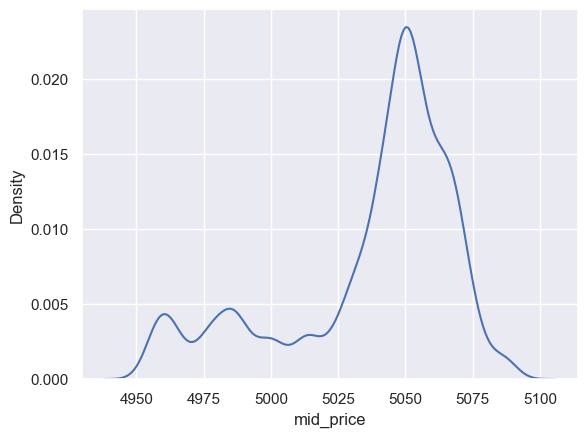

In [354]:
sns.kdeplot(data_train['mid_price'].shift(-1))

In [360]:
plt.figure(figsize=[200,80])
data_train['mid_price'].plot()
pd.Series(clf.predict(data_train), index= data_train.index).plot()

<Axes: xlabel='timestamp_new'>

In [358]:
pd.Series(clf.predict(data_train), index= data_train.index)

timestamp_new
600        5000.054496
700        5000.066428
800        5001.095257
900        5001.401533
1000       5001.218987
              ...     
2999300    5051.863519
2999400    5051.586034
2999500    5052.002598
2999600    5051.380169
2999700    5051.920447
Length: 29992, dtype: float64

In [367]:
data_traindata_train

,mid_price_3,mid_price_2,mid_price_1,mid_price,imbalance_1,imbalance,spread_1,spread,vwap_1,vwap
timestamp_new,,,,,,,,,,
600,4999.5,4998.5,5002.0,4999.5,0.016393,0.000000,2.0,7,5004.0,5004.0
700,4998.5,5002.0,4999.5,5000.0,0.000000,0.000000,7.0,6,5004.0,5004.0
800,5002.0,4999.5,5000.0,5002.5,0.000000,0.021277,6.0,1,5004.0,5004.0
900,4999.5,5000.0,5002.5,5002.5,0.021277,0.032258,1.0,3,5004.0,5004.0
1000,5000.0,5002.5,5002.5,4999.0,0.032258,-0.142857,3.0,4,5004.0,5001.0
...,...,...,...,...,...,...,...,...,...,...
2999300,5053.0,5052.0,5051.5,5052.0,-0.038462,0.068966,5.0,6,5050.0,5050.0
2999400,5052.0,5051.5,5052.0,5051.5,0.068966,0.000000,6.0,7,5050.0,5050.0
2999500,5051.5,5052.0,5051.5,5052.5,0.000000,0.000000,7.0,7,5050.0,5050.0


In [394]:
algo = pd.read_csv('features.txt', header = None, sep=' ')

ParserError: Error tokenizing data. C error: Expected 1 fields in line 5, saw 2


In [379]:
algo

,0,1,2,3,4,5,6,7,8,9
0,5002.0,5000.0,4999.5,4999.5,0.000000,0.000000,7.0,7.0,5004.0,5004.0
1,4999.5,4999.5,4998.5,4998.5,0.000000,0.000000,7.0,7.0,5004.0,5004.0
2,4998.5,4998.5,5002.0,5002.0,61.000000,61.000000,2.0,2.0,5004.0,5004.0
3,5002.0,5002.0,4999.5,4999.5,0.000000,0.000000,7.0,7.0,5004.0,5004.0
4,4999.5,4999.5,5000.0,5000.0,0.000000,0.000000,6.0,6.0,5004.0,5004.0
...,...,...,...,...,...,...,...,...,...,...
29992,5051.5,5051.5,5052.5,5052.5,0.000000,0.000000,7.0,7.0,5050.0,5050.0
29993,5052.5,5052.5,5051.0,5051.0,9.285714,9.285714,6.0,6.0,5049.0,5049.0
29994,5051.0,5051.0,5053.5,5053.5,53.000000,53.000000,1.0,1.0,5048.0,5048.0
29995,5053.5,5053.5,5049.5,5049.5,-55.000000,-55.000000,5.0,5.0,5048.0,5048.0


In [380]:
(algo[6] == algo[7] ).sum()

29997

In [383]:
data_train

,mid_price_3,mid_price_2,mid_price_1,mid_price,imbalance_1,imbalance,spread_1,spread,vwap_1,vwap
timestamp_new,,,,,,,,,,
600,4999.5,4998.5,5002.0,4999.5,0.016393,0.000000,2.0,7,5004.0,5004.0
700,4998.5,5002.0,4999.5,5000.0,0.000000,0.000000,7.0,6,5004.0,5004.0
800,5002.0,4999.5,5000.0,5002.5,0.000000,0.021277,6.0,1,5004.0,5004.0
900,4999.5,5000.0,5002.5,5002.5,0.021277,0.032258,1.0,3,5004.0,5004.0
1000,5000.0,5002.5,5002.5,4999.0,0.032258,-0.142857,3.0,4,5004.0,5001.0
...,...,...,...,...,...,...,...,...,...,...
2999300,5053.0,5052.0,5051.5,5052.0,-0.038462,0.068966,5.0,6,5050.0,5050.0
2999400,5052.0,5051.5,5052.0,5051.5,0.068966,0.000000,6.0,7,5050.0,5050.0
2999500,5051.5,5052.0,5051.5,5052.5,0.000000,0.000000,7.0,7,5050.0,5050.0


In [386]:
[1,2,3] +  [3,4] + [5,6] + [7,7]

[1, 2, 3, 3, 4, 5, 6, 7, 7]

In [391]:
data_train[:20]

,mid_price,imbalance,spread,vwap
timestamp_new,,,,
0,5000.0,0.000000,6,NaN
100,5002.0,0.215686,4,5003.000000
200,5000.0,0.000000,6,5004.000000
300,4999.5,0.000000,7,5004.000000
400,4998.5,0.000000,7,5004.000000
500,5002.0,0.016393,2,5004.000000
600,4999.5,0.000000,7,5004.000000
700,5000.0,0.000000,6,5004.000000
800,5002.5,0.021277,1,5004.000000


In [484]:
def objective(trial) -> float:
    '''
    The oobjective function for the optimisation problem.
    
    Args:
        trial: optuna.trial object
        X_train: ndarray or DataFrame, The features of training dataset
        y_train: Index or array-like, The Target of training dataset
        X_val: ndarray or DataFrame, The features of validation dastaset
        y_val: Index or array-like, The Target of validation dataset

    Returns:
        numeric, the performance mertic for the model training
    '''
    # the parameters you want to optimise and the sapce you wanna search
    a = trial.suggest_float('a', 1e-2, 5.0, log = True)
    b = trial.suggest_float('b', 1e-2, 5.0, log = True)
    
    profit = hypertune.get_profit(round_1_train.Trader(intercept = a, coef = b))
    return profit

def hyper_tune( direction="maximize", n_trials=50):
    study_name="Linear Regression"
    direction=direction # maximize or minimize
    n_trials=n_trials

    study = optuna.create_study(direction=direction, study_name=study_name)
    func = lambda trial: objective(trial)
    study.optimize(func, n_trials=n_trials)
    return study

In [485]:
study = hyper_tune(n_trials = 200)

[I 2024-04-11 23:59:41,210] A new study created in memory with name: Linear Regression


Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1
AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520



[I 2024-04-11 23:59:42,468] Trial 0 finished with value: 48467.5 and parameters: {'a': 0.008582454110483636, 'b': 0.0024987094068651067}. Best is trial 0 with value: 48467.5.


Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 3,348
Total profit: 15,530

Backtesting round_1_train on round 1 day -1


[I 2024-04-11 23:59:43,470] Trial 1 finished with value: 28014.0 and parameters: {'a': 0.8365297994218116, 'b': 5.705835372924197}. Best is trial 0 with value: 48467.5.


AMETHYSTS: 11,346
STARFRUIT: 1,138
Total profit: 12,484

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-11 23:59:44,463] Trial 2 finished with value: 57832.5 and parameters: {'a': 0.001246123183367774, 'b': 2.8350264541355874}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-11 23:59:45,471] Trial 3 finished with value: 48467.5 and parameters: {'a': 1.0937141001763921, 'b': 0.010046423293226048}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-11 23:59:46,461] Trial 4 finished with value: 48467.5 and parameters: {'a': 0.02781596598425011, 'b': 0.09745861017030245}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-11 23:59:47,651] Trial 5 finished with value: 48467.5 and parameters: {'a': 0.23208461370659544, 'b': 0.005001786844558236}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-11 23:59:48,657] Trial 6 finished with value: 48467.5 and parameters: {'a': 0.017038164131282143, 'b': 0.015898327352276722}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 13,998
Total profit: 26,180

Backtesting round_1_train on round 1 day -1


[I 2024-04-11 23:59:49,649] Trial 7 finished with value: 50461.0 and parameters: {'a': 9.701658167777916, 'b': 0.10853910980570783}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,936
Total profit: 24,282

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-11 23:59:50,629] Trial 8 finished with value: 48467.5 and parameters: {'a': 0.017517466820955563, 'b': 0.004741963887547295}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-11 23:59:51,785] Trial 9 finished with value: 48467.5 and parameters: {'a': 0.1604489368938023, 'b': 0.18169648723594012}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 5,566
Total profit: 17,747

Backtesting round_1_train on round 1 day -1


[I 2024-04-11 23:59:52,771] Trial 10 finished with value: 33793.0 and parameters: {'a': 0.0016795938189723683, 'b': 8.464970198403119}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 4,700
Total profit: 16,046

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,979
Total profit: 28,160

Backtesting round_1_train on round 1 day -1


[I 2024-04-11 23:59:53,765] Trial 11 finished with value: 55661.5 and parameters: {'a': 4.573635761453053, 'b': 0.795645991853992}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,156
Total profit: 27,502

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-11 23:59:54,751] Trial 12 finished with value: 57832.5 and parameters: {'a': 0.0011438859469647727, 'b': 1.2025152312754164}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-11 23:59:55,944] Trial 13 finished with value: 57832.5 and parameters: {'a': 0.0010001652096636236, 'b': 1.294997641400676}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-11 23:59:56,961] Trial 14 finished with value: 57832.5 and parameters: {'a': 0.0028578623409904647, 'b': 1.4470180216312996}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-11 23:59:57,968] Trial 15 finished with value: 48467.5 and parameters: {'a': 0.004406595665094398, 'b': 0.345339534256319}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-11 23:59:58,970] Trial 16 finished with value: 57832.5 and parameters: {'a': 0.005161213377000951, 'b': 2.8098887585174634}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1
AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520



[I 2024-04-12 00:00:00,170] Trial 17 finished with value: 48467.5 and parameters: {'a': 0.053605448609629666, 'b': 0.47949292278037275}. Best is trial 2 with value: 57832.5.


Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:01,178] Trial 18 finished with value: 57832.5 and parameters: {'a': 0.0010323181521192616, 'b': 2.777307545201047}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:02,199] Trial 19 finished with value: 48467.5 and parameters: {'a': 0.0027624206491720774, 'b': 0.04211400508904461}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:03,203] Trial 20 finished with value: 57832.5 and parameters: {'a': 0.008373432832995808, 'b': 2.856788657719641}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:04,201] Trial 21 finished with value: 57832.5 and parameters: {'a': 0.0013963433010982498, 'b': 1.2908866485414026}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:05,385] Trial 22 finished with value: 48467.5 and parameters: {'a': 0.001158356791317266, 'b': 0.37835274321677753}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 1,032
Total profit: 13,214

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:06,396] Trial 23 finished with value: 25014.0 and parameters: {'a': 0.0029042864865121564, 'b': 9.942824204110408}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 454
Total profit: 11,800

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:07,412] Trial 24 finished with value: 57832.5 and parameters: {'a': 0.008268576189745, 'b': 1.168496315509315}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,918
Total profit: 28,099

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:08,416] Trial 25 finished with value: 55032.5 and parameters: {'a': 0.001030399890567966, 'b': 3.7381826657750707}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 15,588
Total profit: 26,934

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:09,599] Trial 26 finished with value: 48467.5 and parameters: {'a': 0.0022342413974131684, 'b': 0.6702199524225324}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:10,646] Trial 27 finished with value: 48467.5 and parameters: {'a': 0.06754315191362706, 'b': 0.22780363272703136}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:11,675] Trial 28 finished with value: 57832.5 and parameters: {'a': 0.006578289668503717, 'b': 1.7606676656147706}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,918
Total profit: 28,099

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:12,691] Trial 29 finished with value: 55032.5 and parameters: {'a': 0.015430018905105019, 'b': 4.5839957011586465}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 15,588
Total profit: 26,934

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:13,698] Trial 30 finished with value: 48467.5 and parameters: {'a': 0.0036686411562346422, 'b': 0.03624451423289262}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:14,875] Trial 31 finished with value: 57832.5 and parameters: {'a': 0.002111167599354357, 'b': 1.4043907380865903}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:15,900] Trial 32 finished with value: 48467.5 and parameters: {'a': 0.0021444922301598482, 'b': 0.8442632577039114}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:16,922] Trial 33 finished with value: 48467.5 and parameters: {'a': 0.004001498736138646, 'b': 0.0011841316245205502}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:17,915] Trial 34 finished with value: 57832.5 and parameters: {'a': 0.3822887374098121, 'b': 1.9807592064279886}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,846
Total profit: 25,027

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:19,084] Trial 35 finished with value: 48053.0 and parameters: {'a': 0.0010009854390657057, 'b': 5.853868380197925}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 11,680
Total profit: 23,026

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,846
Total profit: 25,027

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:20,099] Trial 36 finished with value: 48053.0 and parameters: {'a': 0.0017914790360782206, 'b': 5.357923652092957}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 11,680
Total profit: 23,026

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:21,126] Trial 37 finished with value: 48467.5 and parameters: {'a': 0.012095512606969826, 'b': 0.21706715383107694}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:22,146] Trial 38 finished with value: 48467.5 and parameters: {'a': 0.027780345257290725, 'b': 0.6381437214587233}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1
AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520



[I 2024-04-12 00:00:23,344] Trial 39 finished with value: 48467.5 and parameters: {'a': 1.0052612686611992, 'b': 0.11073503480196802}. Best is trial 2 with value: 57832.5.


Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:24,384] Trial 40 finished with value: 57832.5 and parameters: {'a': 0.006045262264340006, 'b': 2.113640631529814}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:25,413] Trial 41 finished with value: 57832.5 and parameters: {'a': 0.004626638845758525, 'b': 1.053304194357684}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,918
Total profit: 28,099

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:26,467] Trial 42 finished with value: 55032.5 and parameters: {'a': 0.001711643273175937, 'b': 3.125252858222734}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 15,588
Total profit: 26,934

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,846
Total profit: 25,027

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:27,468] Trial 43 finished with value: 48053.0 and parameters: {'a': 0.003083929129434814, 'b': 6.686830598529625}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 11,680
Total profit: 23,026

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:28,648] Trial 44 finished with value: 57832.5 and parameters: {'a': 0.005071568370002288, 'b': 2.2385802684202196}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,918
Total profit: 28,099

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:29,667] Trial 45 finished with value: 55032.5 and parameters: {'a': 0.026347196491225293, 'b': 4.106479105693118}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 15,588
Total profit: 26,934

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:30,690] Trial 46 finished with value: 48467.5 and parameters: {'a': 0.0015610121002217576, 'b': 0.532452339339485}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:31,705] Trial 47 finished with value: 48467.5 and parameters: {'a': 0.010494973434655048, 'b': 0.328232703878349}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 10,693
Total profit: 22,874

Backtesting round_1_train on round 1 day -1
AMETHYSTS: 11,346
STARFRUIT: 11,099
Total profit: 22,445



[I 2024-04-12 00:00:32,895] Trial 48 finished with value: 45319.0 and parameters: {'a': 3.6611794555694503, 'b': 1.5181915230853358}. Best is trial 2 with value: 57832.5.


Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:33,929] Trial 49 finished with value: 57832.5 and parameters: {'a': 0.0032761684384212133, 'b': 1.0239731985408271}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 5,566
Total profit: 17,747

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:34,953] Trial 50 finished with value: 33793.0 and parameters: {'a': 0.0014318460211066428, 'b': 7.329651456433045}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 4,700
Total profit: 16,046

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:35,979] Trial 51 finished with value: 57832.5 and parameters: {'a': 0.001000307820267463, 'b': 2.6129077181375906}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,918
Total profit: 28,099

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:36,978] Trial 52 finished with value: 55032.5 and parameters: {'a': 0.00210638790605262, 'b': 3.623630119981885}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 15,588
Total profit: 26,934

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:38,165] Trial 53 finished with value: 57832.5 and parameters: {'a': 0.0014560981288096006, 'b': 2.977558546948779}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:39,192] Trial 54 finished with value: 57832.5 and parameters: {'a': 0.002958805882949794, 'b': 1.7412333323353095}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:40,217] Trial 55 finished with value: 48467.5 and parameters: {'a': 0.001337907595560466, 'b': 0.8974643659165248}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:41,241] Trial 56 finished with value: 48467.5 and parameters: {'a': 0.002361215647778526, 'b': 0.010077175480254226}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 1,032
Total profit: 13,214

Backtesting round_1_train on round 1 day -1
AMETHYSTS: 11,346
STARFRUIT: 454
Total profit: 11,800



[I 2024-04-12 00:00:42,418] Trial 57 finished with value: 25014.0 and parameters: {'a': 0.008197953788914008, 'b': 9.744604160776335}. Best is trial 2 with value: 57832.5.


Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:43,456] Trial 58 finished with value: 48467.5 and parameters: {'a': 0.047561820212586224, 'b': 0.4384425521411668}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 13,917
Total profit: 26,098

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:44,480] Trial 59 finished with value: 50943.0 and parameters: {'a': 0.4744418009871576, 'b': 3.877867545815913}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 13,499
Total profit: 24,845

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:45,508] Trial 60 finished with value: 48467.5 and parameters: {'a': 0.00579556514966725, 'b': 0.03965178210783145}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:46,527] Trial 61 finished with value: 57832.5 and parameters: {'a': 0.0012510915726459291, 'b': 2.766114624584143}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:47,719] Trial 62 finished with value: 57832.5 and parameters: {'a': 0.13429449657772694, 'b': 1.350614926812125}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,846
Total profit: 25,027

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:48,739] Trial 63 finished with value: 48053.0 and parameters: {'a': 0.0025689501044691273, 'b': 5.180502339707131}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 11,680
Total profit: 23,026

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:49,768] Trial 64 finished with value: 57832.5 and parameters: {'a': 0.003711187384580203, 'b': 2.4279051014202246}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:50,774] Trial 65 finished with value: 57832.5 and parameters: {'a': 0.0018481542409034067, 'b': 1.6111047595426262}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1
AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520



[I 2024-04-12 00:00:51,975] Trial 66 finished with value: 48467.5 and parameters: {'a': 0.008591012121845132, 'b': 0.679603706469956}. Best is trial 2 with value: 57832.5.


Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:53,013] Trial 67 finished with value: 57832.5 and parameters: {'a': 0.001015521118314886, 'b': 1.1340983239200055}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:54,057] Trial 68 finished with value: 48467.5 and parameters: {'a': 0.01666593439165337, 'b': 0.30672126506311775}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,918
Total profit: 28,099

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:55,080] Trial 69 finished with value: 55032.5 and parameters: {'a': 0.004033553579101617, 'b': 4.840006688004701}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 15,588
Total profit: 26,934

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:56,092] Trial 70 finished with value: 57832.5 and parameters: {'a': 0.002493473379158672, 'b': 2.173308678555628}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1
AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294



[I 2024-04-12 00:00:57,285] Trial 71 finished with value: 57832.5 and parameters: {'a': 0.001332576815905191, 'b': 1.3862272415164394}. Best is trial 2 with value: 57832.5.


Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:58,322] Trial 72 finished with value: 48467.5 and parameters: {'a': 0.0017601702742203308, 'b': 0.8478015301344425}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,918
Total profit: 28,099

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:00:59,354] Trial 73 finished with value: 55032.5 and parameters: {'a': 0.0012827213181374056, 'b': 3.3224969888819182}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 15,588
Total profit: 26,934

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:00,383] Trial 74 finished with value: 57832.5 and parameters: {'a': 0.001933651277501028, 'b': 1.7320775551283119}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:01,414] Trial 75 finished with value: 48467.5 and parameters: {'a': 0.004497725883459986, 'b': 0.6033935860132934}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:02,619] Trial 76 finished with value: 48467.5 and parameters: {'a': 0.007326083905835494, 'b': 0.07281135354240098}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 5,566
Total profit: 17,747

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:03,642] Trial 77 finished with value: 33793.0 and parameters: {'a': 0.0030226495714717073, 'b': 7.36534144645651}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 4,700
Total profit: 16,046

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:04,666] Trial 78 finished with value: 57832.5 and parameters: {'a': 0.0015240821253783184, 'b': 2.0286862370615313}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:05,676] Trial 79 finished with value: 57832.5 and parameters: {'a': 0.011014663612069979, 'b': 1.289754124814469}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,918
Total profit: 28,099

Backtesting round_1_train on round 1 day -1
AMETHYSTS: 11,346
STARFRUIT: 15,588
Total profit: 26,934



[I 2024-04-12 00:01:06,889] Trial 80 finished with value: 55032.5 and parameters: {'a': 0.0054081173333393445, 'b': 4.342486263793477}. Best is trial 2 with value: 57832.5.


Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:07,930] Trial 81 finished with value: 48467.5 and parameters: {'a': 0.001014575642304894, 'b': 0.7803798920211964}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:08,951] Trial 82 finished with value: 57832.5 and parameters: {'a': 0.01419867189795852, 'b': 1.0752922647268373}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:09,967] Trial 83 finished with value: 57832.5 and parameters: {'a': 0.0024243601965382934, 'b': 2.85155293133312}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:10,978] Trial 84 finished with value: 48467.5 and parameters: {'a': 0.02119961133093616, 'b': 0.4781067402817421}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:12,171] Trial 85 finished with value: 57832.5 and parameters: {'a': 0.003437265213056081, 'b': 1.914199641348203}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,846
Total profit: 25,027

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:13,194] Trial 86 finished with value: 48053.0 and parameters: {'a': 0.0017285916839112705, 'b': 5.865179796036836}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 11,680
Total profit: 23,026

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:14,216] Trial 87 finished with value: 57832.5 and parameters: {'a': 0.0012113279146963754, 'b': 1.1353587924338873}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,918
Total profit: 28,099

Backtesting round_1_train on round 1 day -1
AMETHYSTS: 11,346
STARFRUIT: 15,588
Total profit: 26,934



[I 2024-04-12 00:01:15,425] Trial 88 finished with value: 55032.5 and parameters: {'a': 0.006690816059486555, 'b': 3.3466690606937153}. Best is trial 2 with value: 57832.5.


Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:16,479] Trial 89 finished with value: 48467.5 and parameters: {'a': 0.002251530984021626, 'b': 0.0031947970843494073}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:17,522] Trial 90 finished with value: 57832.5 and parameters: {'a': 0.040851132473743376, 'b': 2.441013922323308}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:18,552] Trial 91 finished with value: 57832.5 and parameters: {'a': 0.010461886202161826, 'b': 1.5728300042288939}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:19,566] Trial 92 finished with value: 57832.5 and parameters: {'a': 0.00908790818456656, 'b': 1.8115588193747827}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1
AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520



[I 2024-04-12 00:01:20,777] Trial 93 finished with value: 48467.5 and parameters: {'a': 0.004997810498236336, 'b': 0.7690761895240487}. Best is trial 2 with value: 57832.5.


Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,084
Total profit: 29,266

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:21,840] Trial 94 finished with value: 57419.5 and parameters: {'a': 0.08810845128569675, 'b': 0.9951101276941927}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,808
Total profit: 28,154

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:22,881] Trial 95 finished with value: 57832.5 and parameters: {'a': 0.002855251131569545, 'b': 1.312083765377982}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:23,915] Trial 96 finished with value: 57832.5 and parameters: {'a': 0.0015411992851103768, 'b': 2.662512828402295}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:24,944] Trial 97 finished with value: 48467.5 and parameters: {'a': 2.7094848538806633, 'b': 0.020682679523953976}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,918
Total profit: 28,099

Backtesting round_1_train on round 1 day -1
AMETHYSTS: 11,346
STARFRUIT: 15,588
Total profit: 26,934



[I 2024-04-12 00:01:26,149] Trial 98 finished with value: 55032.5 and parameters: {'a': 0.006288652546599585, 'b': 3.7636205027250536}. Best is trial 2 with value: 57832.5.


Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:27,195] Trial 99 finished with value: 48467.5 and parameters: {'a': 0.013735969445700397, 'b': 0.4023731043158887}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:28,225] Trial 100 finished with value: 57832.5 and parameters: {'a': 0.020305883900955047, 'b': 2.2292057020596405}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:29,250] Trial 101 finished with value: 57832.5 and parameters: {'a': 0.002058830945523171, 'b': 1.5642676791664087}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1
AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520



[I 2024-04-12 00:01:30,464] Trial 102 finished with value: 48467.5 and parameters: {'a': 0.0012495172329628752, 'b': 0.5676152888698794}. Best is trial 2 with value: 57832.5.


Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:31,503] Trial 103 finished with value: 57832.5 and parameters: {'a': 0.0038806266202521724, 'b': 1.2321250080355324}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:32,542] Trial 104 finished with value: 57832.5 and parameters: {'a': 0.0011331985221706307, 'b': 1.9005375207828257}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:33,581] Trial 105 finished with value: 48467.5 and parameters: {'a': 0.0018831851199209355, 'b': 0.9220681319528335}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:34,605] Trial 106 finished with value: 57832.5 and parameters: {'a': 0.0015102894170906259, 'b': 2.949564531458529}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1
AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520



[I 2024-04-12 00:01:35,821] Trial 107 finished with value: 48467.5 and parameters: {'a': 0.002674434509141813, 'b': 0.15261123705589727}. Best is trial 2 with value: 57832.5.


Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:36,861] Trial 108 finished with value: 48467.5 and parameters: {'a': 0.003369282726661739, 'b': 0.7189359891943642}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,918
Total profit: 28,099

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:37,894] Trial 109 finished with value: 55032.5 and parameters: {'a': 0.004548275886654717, 'b': 4.515735521013012}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 15,588
Total profit: 26,934

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,846
Total profit: 25,027

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:38,905] Trial 110 finished with value: 48053.0 and parameters: {'a': 0.0019773358026400124, 'b': 6.218770816172681}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 11,680
Total profit: 23,026

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:39,914] Trial 111 finished with value: 57832.5 and parameters: {'a': 0.3073723401839222, 'b': 1.4730514681222155}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:41,106] Trial 112 finished with value: 57832.5 and parameters: {'a': 0.22364345144985082, 'b': 2.1548225356799766}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 16,263
Total profit: 28,444

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:42,139] Trial 113 finished with value: 56098.5 and parameters: {'a': 0.7918551442952785, 'b': 2.501780864257586}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,308
Total profit: 27,654

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 7,867
Total profit: 20,048

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:43,159] Trial 114 finished with value: 39145.0 and parameters: {'a': 1.5183106354345464, 'b': 3.31197660242663}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 7,751
Total profit: 19,097

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:44,170] Trial 115 finished with value: 57832.5 and parameters: {'a': 0.5372908984380257, 'b': 1.847609672313112}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 2,000
Total profit: 14,181

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:45,347] Trial 116 finished with value: 27727.5 and parameters: {'a': 7.1504142474553385, 'b': 1.1999421340867722}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 2,200
Total profit: 13,546

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:46,388] Trial 117 finished with value: 48467.5 and parameters: {'a': 0.0080537695163181, 'b': 0.955438206294857}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,918
Total profit: 28,099

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:47,400] Trial 118 finished with value: 55032.5 and parameters: {'a': 0.0012109856653425444, 'b': 4.05940588589123}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 15,588
Total profit: 26,934

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1
AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294



[I 2024-04-12 00:01:48,599] Trial 119 finished with value: 57832.5 and parameters: {'a': 0.0015478441484797832, 'b': 1.5731147318227463}. Best is trial 2 with value: 57832.5.


Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:49,637] Trial 120 finished with value: 57832.5 and parameters: {'a': 0.0023799019202210663, 'b': 2.2685528812180404}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:50,673] Trial 121 finished with value: 57832.5 and parameters: {'a': 0.005836869312595692, 'b': 2.7491552029341326}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:51,690] Trial 122 finished with value: 57832.5 and parameters: {'a': 0.007171322467064391, 'b': 1.3828045415153674}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:52,709] Trial 123 finished with value: 57832.5 and parameters: {'a': 0.00977664282061053, 'b': 1.8279553030362832}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,918
Total profit: 28,099

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:53,899] Trial 124 finished with value: 55032.5 and parameters: {'a': 0.0010913267487652895, 'b': 3.1836656069546994}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 15,588
Total profit: 26,934

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,918
Total profit: 28,099

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:54,930] Trial 125 finished with value: 55032.5 and parameters: {'a': 0.004135238687243545, 'b': 4.890113154507024}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 15,588
Total profit: 26,934

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:55,949] Trial 126 finished with value: 57832.5 and parameters: {'a': 0.03488914559558494, 'b': 1.0828475526982155}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1
AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294



[I 2024-04-12 00:01:57,151] Trial 127 finished with value: 57832.5 and parameters: {'a': 0.005337671506043819, 'b': 2.182189280756018}. Best is trial 2 with value: 57832.5.


Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:58,197] Trial 128 finished with value: 48467.5 and parameters: {'a': 0.0013780751994135396, 'b': 0.8291453305186071}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 5,566
Total profit: 17,747

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:01:59,226] Trial 129 finished with value: 33793.0 and parameters: {'a': 0.0017519557112303376, 'b': 8.55620610172247}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 4,700
Total profit: 16,046

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:00,278] Trial 130 finished with value: 57832.5 and parameters: {'a': 0.011855511314276335, 'b': 1.6421059771108686}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:01,289] Trial 131 finished with value: 57832.5 and parameters: {'a': 0.0032990192559621905, 'b': 1.2323457856814242}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:02,484] Trial 132 finished with value: 57832.5 and parameters: {'a': 0.00524304872404831, 'b': 2.024766065582713}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:03,530] Trial 133 finished with value: 48467.5 and parameters: {'a': 0.0066039190419027866, 'b': 0.9648562690944467}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:04,566] Trial 134 finished with value: 57832.5 and parameters: {'a': 0.002095507696540448, 'b': 1.4319061120320273}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:05,599] Trial 135 finished with value: 48467.5 and parameters: {'a': 0.002816928752216802, 'b': 0.0010712786524474656}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1
AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294



[I 2024-04-12 00:02:06,810] Trial 136 finished with value: 57832.5 and parameters: {'a': 0.07106615758954998, 'b': 2.610705679123781}. Best is trial 2 with value: 57832.5.


Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:07,875] Trial 137 finished with value: 57832.5 and parameters: {'a': 0.0010242175202830118, 'b': 1.7397213750137523}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,918
Total profit: 28,099

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:08,913] Trial 138 finished with value: 55032.5 and parameters: {'a': 0.0044792411445689125, 'b': 3.585824220899723}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 15,588
Total profit: 26,934

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:09,959] Trial 139 finished with value: 48467.5 and parameters: {'a': 0.008080504909104785, 'b': 0.2790484243819236}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:11,062] Trial 140 finished with value: 57832.5 and parameters: {'a': 0.14689521729377417, 'b': 1.1437777714451485}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1
AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294



[I 2024-04-12 00:02:12,271] Trial 141 finished with value: 57832.5 and parameters: {'a': 0.003690625010454387, 'b': 2.1312185976537856}. Best is trial 2 with value: 57832.5.


Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,918
Total profit: 28,099

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:13,349] Trial 142 finished with value: 55032.5 and parameters: {'a': 0.0046695229488400046, 'b': 3.0276770428497626}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 15,588
Total profit: 26,934

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:14,428] Trial 143 finished with value: 57832.5 and parameters: {'a': 0.0014264532477083099, 'b': 2.3978020249259457}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:15,517] Trial 144 finished with value: 48467.5 and parameters: {'a': 0.0058193072886844124, 'b': 0.679224429269364}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:16,577] Trial 145 finished with value: 57832.5 and parameters: {'a': 0.0012245930488023484, 'b': 1.427093426915373}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:17,819] Trial 146 finished with value: 57832.5 and parameters: {'a': 0.0016795797078299154, 'b': 1.8039057082843135}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:18,875] Trial 147 finished with value: 48467.5 and parameters: {'a': 0.00924093545664188, 'b': 0.0016407729626850681}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,918
Total profit: 28,099

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:19,897] Trial 148 finished with value: 55032.5 and parameters: {'a': 0.0071151128339354075, 'b': 3.626133790516111}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 15,588
Total profit: 26,934

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:20,915] Trial 149 finished with value: 57832.5 and parameters: {'a': 0.0026288295254751327, 'b': 2.5971872172859434}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:22,114] Trial 150 finished with value: 57832.5 and parameters: {'a': 0.0021554965864397295, 'b': 1.036977729280992}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:23,165] Trial 151 finished with value: 48467.5 and parameters: {'a': 0.0034665526760436255, 'b': 0.520258081902383}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:24,207] Trial 152 finished with value: 57832.5 and parameters: {'a': 0.00425502735353454, 'b': 1.2991655305126772}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:25,249] Trial 153 finished with value: 48467.5 and parameters: {'a': 0.0031459670387109892, 'b': 0.8974871610430195}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:26,445] Trial 154 finished with value: 57832.5 and parameters: {'a': 0.0010126903327235342, 'b': 1.6124023613318923}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:27,490] Trial 155 finished with value: 48467.5 and parameters: {'a': 0.006016152215105064, 'b': 0.07382990220115818}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:28,537] Trial 156 finished with value: 57832.5 and parameters: {'a': 0.0012970467822889273, 'b': 2.0185601968818876}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:29,781] Trial 157 finished with value: 57832.5 and parameters: {'a': 0.0017160091539855553, 'b': 1.137718974369383}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:30,852] Trial 158 finished with value: 48467.5 and parameters: {'a': 0.004997606740409088, 'b': 0.7404923296603438}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,918
Total profit: 28,099

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:31,906] Trial 159 finished with value: 55032.5 and parameters: {'a': 0.002535300353175611, 'b': 4.127429311865149}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 15,588
Total profit: 26,934

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,954
Total profit: 28,135

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:32,940] Trial 160 finished with value: 55214.5 and parameters: {'a': 0.22361525438950947, 'b': 2.9785899817289385}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 15,734
Total profit: 27,080

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1
AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294



[I 2024-04-12 00:02:34,179] Trial 161 finished with value: 57832.5 and parameters: {'a': 0.001183062112319508, 'b': 2.2567923504413625}. Best is trial 2 with value: 57832.5.


Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:35,240] Trial 162 finished with value: 57832.5 and parameters: {'a': 0.001365842812909899, 'b': 1.3962581596610795}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:36,285] Trial 163 finished with value: 57832.5 and parameters: {'a': 0.0010300476372505595, 'b': 1.6900287757497705}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:37,341] Trial 164 finished with value: 57832.5 and parameters: {'a': 0.00179646038430647, 'b': 2.55992357957856}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:38,374] Trial 165 finished with value: 57832.5 and parameters: {'a': 0.11080269884451029, 'b': 2.090904068316467}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 7,867
Total profit: 20,048

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:39,599] Trial 166 finished with value: 39145.0 and parameters: {'a': 1.7069349763549975, 'b': 3.166566823126923}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 7,751
Total profit: 19,097

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,846
Total profit: 25,027

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:40,661] Trial 167 finished with value: 48053.0 and parameters: {'a': 0.0014806454598101633, 'b': 5.247300534168395}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 11,680
Total profit: 23,026

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:41,741] Trial 168 finished with value: 48467.5 and parameters: {'a': 0.004053886156017727, 'b': 0.9176587569548671}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:42,810] Trial 169 finished with value: 57832.5 and parameters: {'a': 0.013261017979886304, 'b': 1.4890926064575754}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1
AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294



[I 2024-04-12 00:02:44,023] Trial 170 finished with value: 57832.5 and parameters: {'a': 0.001003033205560505, 'b': 1.2330813871848638}. Best is trial 2 with value: 57832.5.


Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:45,093] Trial 171 finished with value: 57832.5 and parameters: {'a': 0.0015221702572487885, 'b': 2.631291940500057}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:46,150] Trial 172 finished with value: 57832.5 and parameters: {'a': 0.0011969457877534682, 'b': 1.8299439664331616}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,918
Total profit: 28,099

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:47,193] Trial 173 finished with value: 55032.5 and parameters: {'a': 0.002067625765351392, 'b': 3.770638525455178}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 15,588
Total profit: 26,934

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:48,226] Trial 174 finished with value: 57832.5 and parameters: {'a': 0.007618494521557, 'b': 2.9290039241035104}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:49,471] Trial 175 finished with value: 57832.5 and parameters: {'a': 0.00292978327746384, 'b': 2.2518973890205767}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,918
Total profit: 28,099

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:50,547] Trial 176 finished with value: 55032.5 and parameters: {'a': 0.001458478238587465, 'b': 4.408885989153691}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 15,588
Total profit: 26,934

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:51,611] Trial 177 finished with value: 57832.5 and parameters: {'a': 0.002342331806402255, 'b': 1.8640525843143687}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:52,957] Trial 178 finished with value: 57832.5 and parameters: {'a': 0.3465804958855057, 'b': 1.4952114867385526}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:54,069] Trial 179 finished with value: 57832.5 and parameters: {'a': 0.006198012709620992, 'b': 1.0874922572786019}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,918
Total profit: 28,099

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:55,173] Trial 180 finished with value: 55032.5 and parameters: {'a': 0.001883738478079943, 'b': 3.4788967527614956}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 15,588
Total profit: 26,934

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:56,234] Trial 181 finished with value: 57832.5 and parameters: {'a': 0.003558255156358296, 'b': 2.340005157267081}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1
AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294



[I 2024-04-12 00:02:57,456] Trial 182 finished with value: 57832.5 and parameters: {'a': 0.004766732504615803, 'b': 1.647487732300572}. Best is trial 2 with value: 57832.5.


Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:58,534] Trial 183 finished with value: 57832.5 and parameters: {'a': 0.002966547282263234, 'b': 2.000778720765851}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:02:59,585] Trial 184 finished with value: 57832.5 and parameters: {'a': 0.001213542613164273, 'b': 1.2690521408206827}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:03:00,631] Trial 185 finished with value: 57832.5 and parameters: {'a': 0.0015526309064031122, 'b': 2.7015463633709507}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:03:01,664] Trial 186 finished with value: 57832.5 and parameters: {'a': 0.01053532189538518, 'b': 1.6326059501202808}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:03:02,895] Trial 187 finished with value: 48467.5 and parameters: {'a': 0.002300932608555066, 'b': 0.847615979596989}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:03:03,965] Trial 188 finished with value: 57832.5 and parameters: {'a': 0.005554665848813218, 'b': 1.0901125812931287}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,918
Total profit: 28,099

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:03:05,017] Trial 189 finished with value: 55032.5 and parameters: {'a': 0.00387670330794007, 'b': 3.2604860243907337}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 15,588
Total profit: 26,934

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:03:06,060] Trial 190 finished with value: 57832.5 and parameters: {'a': 0.0087606918951416, 'b': 2.0251786350608816}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1
AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294



[I 2024-04-12 00:03:07,304] Trial 191 finished with value: 57832.5 and parameters: {'a': 0.0012572908619413088, 'b': 2.548336776630232}. Best is trial 2 with value: 57832.5.


Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:03:08,363] Trial 192 finished with value: 57832.5 and parameters: {'a': 0.0010198461931067043, 'b': 1.3419433988597185}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:03:09,420] Trial 193 finished with value: 57832.5 and parameters: {'a': 0.0017425880051785533, 'b': 2.956397211942758}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:03:10,475] Trial 194 finished with value: 57832.5 and parameters: {'a': 0.001269502448181211, 'b': 2.3468747063642166}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:03:11,511] Trial 195 finished with value: 57832.5 and parameters: {'a': 0.0014749844972414558, 'b': 1.7904153830536822}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:03:12,760] Trial 196 finished with value: 48467.5 and parameters: {'a': 0.006642338347291995, 'b': 0.009055967510806898}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 15,918
Total profit: 28,099

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:03:13,834] Trial 197 finished with value: 55032.5 and parameters: {'a': 0.002071258420286109, 'b': 3.9417527707671116}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 15,588
Total profit: 26,934

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 17,358
Total profit: 29,538

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:03:14,889] Trial 198 finished with value: 57832.5 and parameters: {'a': 0.0032373595336328367, 'b': 1.4864397295078278}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 16,948
Total profit: 28,294

Backtesting round_1_train on round 1 day -2
AMETHYSTS: 12,181
STARFRUIT: 12,766
Total profit: 24,948

Backtesting round_1_train on round 1 day -1


[I 2024-04-12 00:03:15,936] Trial 199 finished with value: 48467.5 and parameters: {'a': 0.0011708638008011672, 'b': 0.9830336454019618}. Best is trial 2 with value: 57832.5.


AMETHYSTS: 11,346
STARFRUIT: 12,174
Total profit: 23,520

